In [1]:
import json
import torch.nn as nn
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib 
import os
import sys
sys.path.append('/home/ravikothari/dev/code/architectures')
from tqdm import tqdm
from post_process_numpy_neu import peaks_detect,association,create_default,distribute,analyse,update_peaks
device ='cpu'

100%|██████████| 1/1 [00:10<00:00, 10.28s/it]


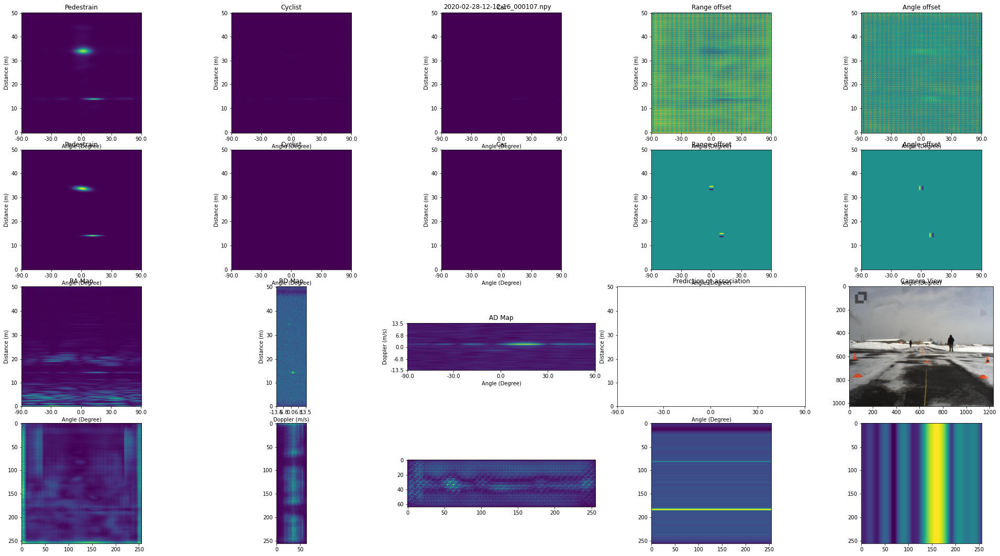

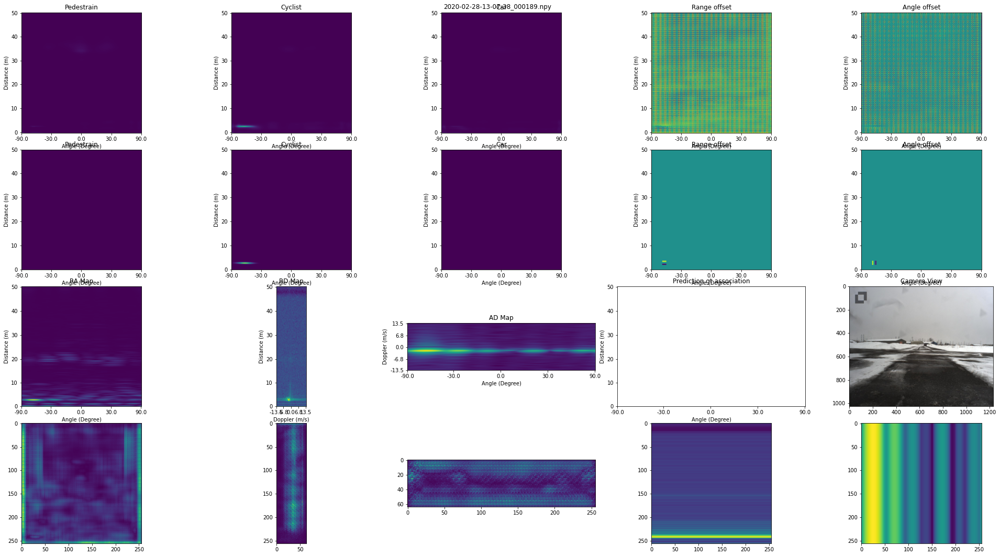

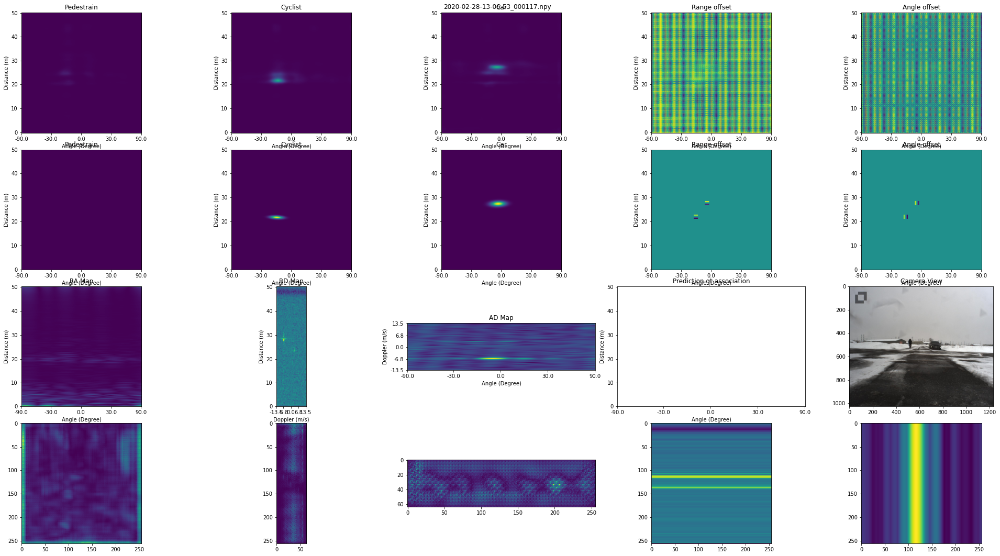

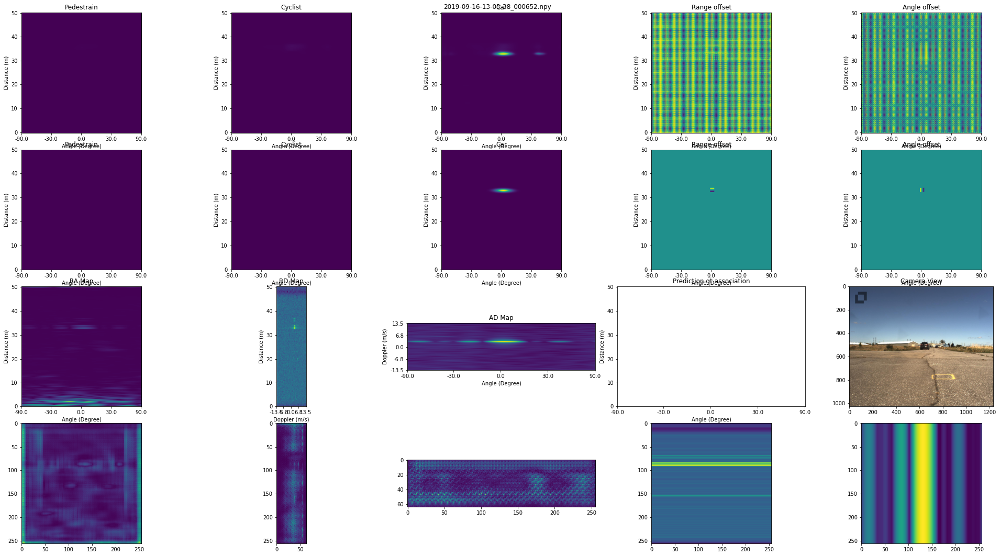

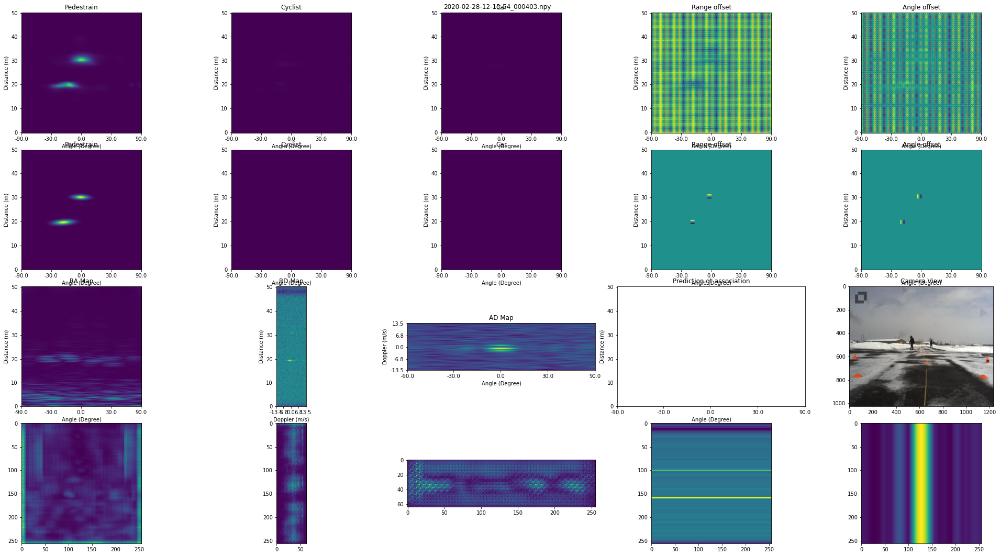

...

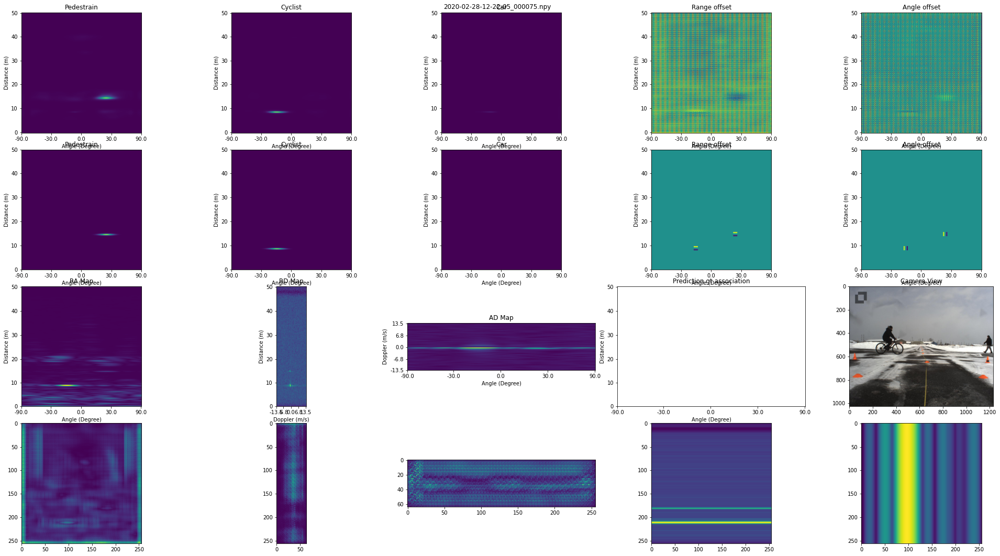

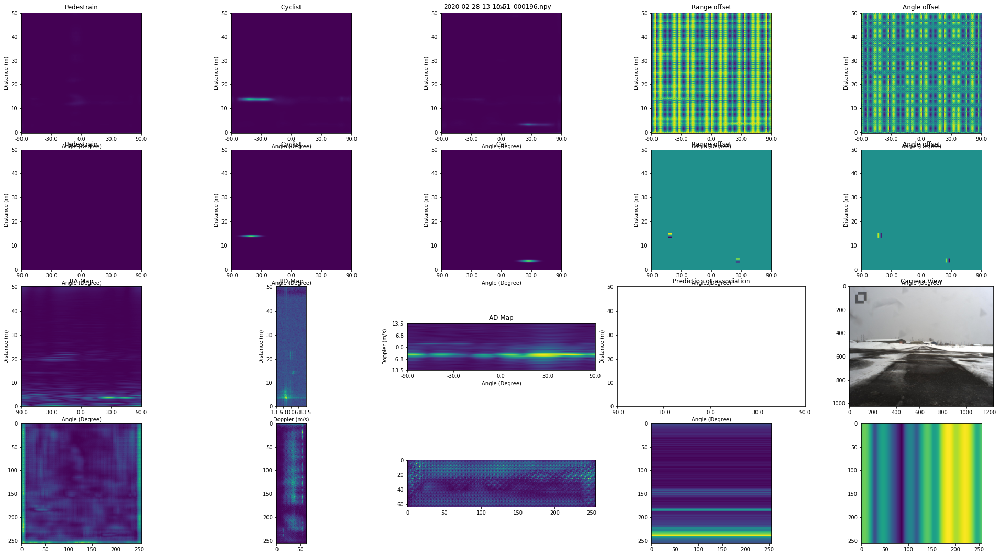

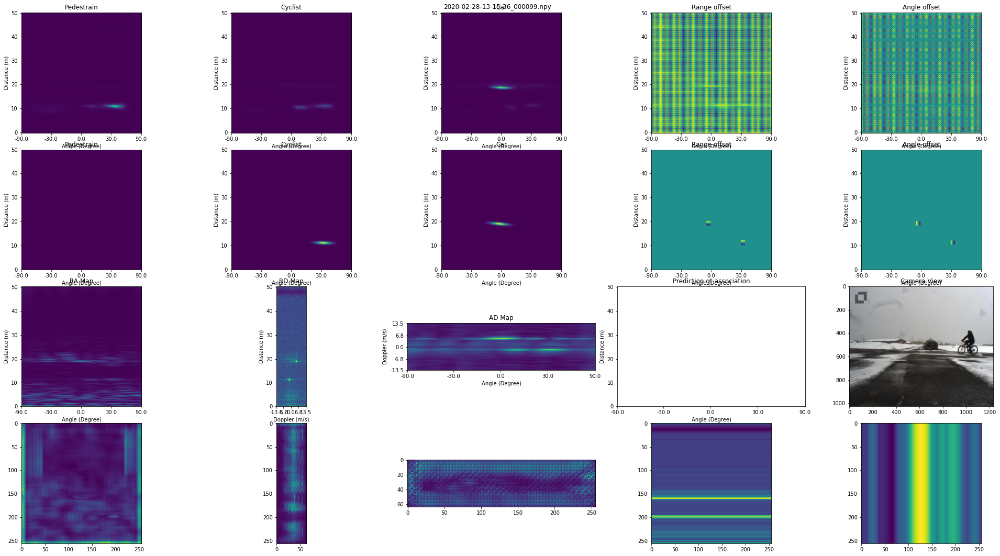

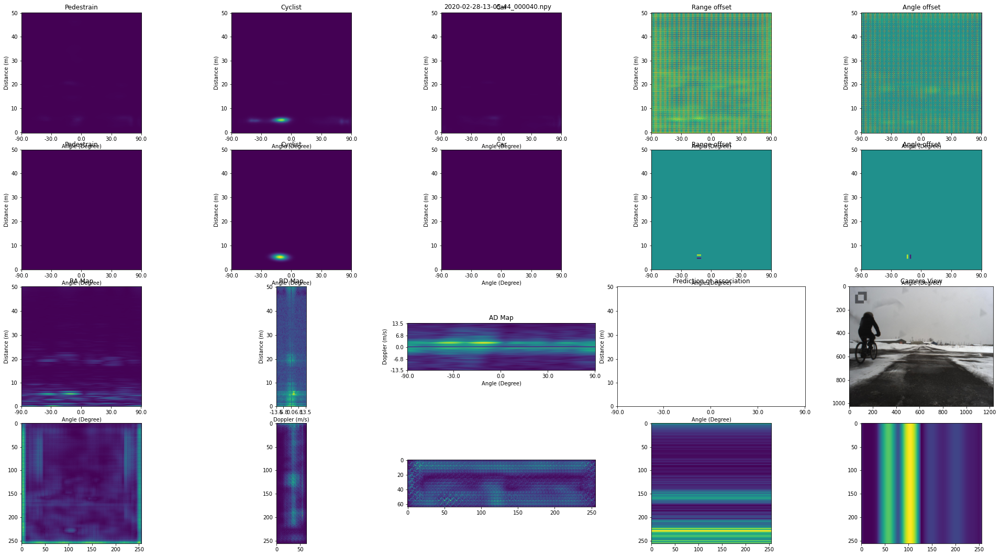

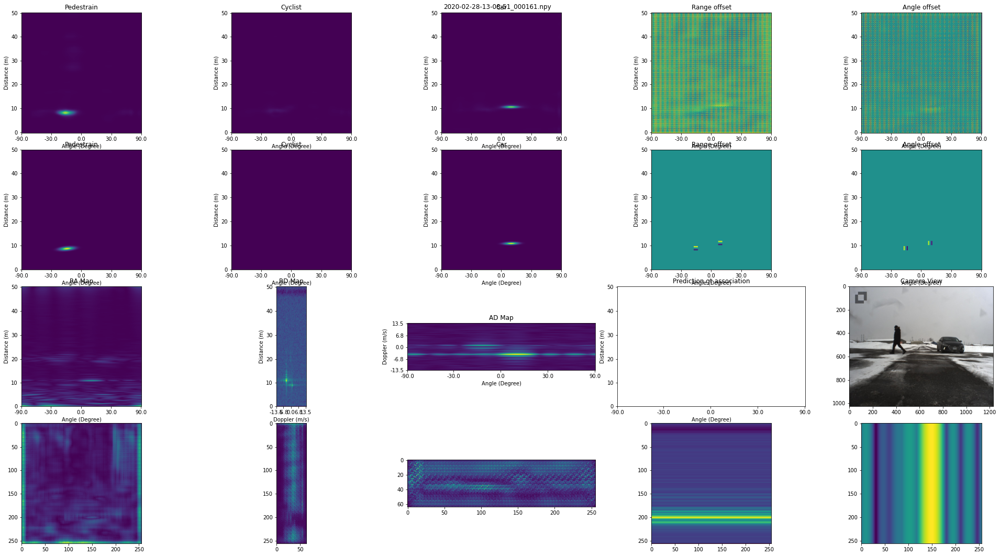

In [2]:
#preds_batch = np.load(r'saved_images\0_preds.npy')
name_list = np.load('saved_feature/name_list.npy',allow_pickle=True).item()
for frame in tqdm(range(1)):
    frame = 2
    img_list = name_list[f"{frame}"]

    grd_map = np.load(f"saved_feature/{frame}_grd_map.npy")
    grd_c = np.load(f"saved_feature/{frame}_grd_c.npy")
    ra_map = np.load(f"saved_feature/{frame}_ra_map.npy")
    rd_map = np.load(f"saved_feature/{frame}_rd_map.npy")
    ad_map = np.load(f"saved_feature/{frame}_ad_map.npy")

    ra_feature = np.load(f"saved_feature/{frame}_ra_feature.npy")
    rd_feature = np.load(f"saved_feature/{frame}_rd_feature.npy")
    ad_feature = np.load(f"saved_feature/{frame}_ad_feature.npy")
    ra_attention = np.load(f"saved_feature/{frame}_ra_attention.npy")
    rd_b = np.load(f"saved_feature/{frame}_rd_b.npy")
    ad_b = np.load(f"saved_feature/{frame}_ad_b.npy")


    pred_map = np.load(f"saved_output/{frame}_preds_map.npy")
    pred_c = np.load(f"saved_feature/{frame}_preds_c.npy")
    pred_c = 8*(pred_c-0.5)
    cam_dir = f"saved_feature/{frame}"
    dir_img = r'analysis'


    # pred_cp =torch.Tensor().to(device =device)
    # grd_cp =torch.Tensor().to(device =device)

    # grd_intent,grd_idx = peaks_detect(torch.from_numpy(grd_map),mask,peak_cls,heat_thresh=0.8)
    # grd_idx = distribute(grd_idx,device)
    # grd_idx=grd_idx.to(device='cpu')
    # #grd_idx,grd_intent= association(grd_intent,grd_idx,device)

    # pred_intent_c,pred_idx = peaks_detect(torch.from_numpy(pred_map),mask,peak_cls,heat_thresh=0.1)
    # pred_idx_bu = distribute(pred_idx,device)
    # #print(len(pred_idx[0]))
    # pred_idx_c = update_peaks(pred_c,pred_idx_bu)
    # pred_idx,pred_intent= association(pred_intent_c,pred_idx_c,device)
    # pred_idx=pred_idx.to(device='cpu')

    # grd_cp,prd_cp = analyse(grd_idx,pred_idx,grd_cp,pred_cp,frame,dist_thresh=2)
    # pred_idx =pred_idx.numpy()
    # grd_idx = grd_idx.numpy()
    # grd_cp = np.reshape(grd_cp.numpy(),(len(grd_cp.numpy())//5,5)).astype('int')
    # prd_cp = np.reshape(prd_cp.numpy(),(len(prd_cp.numpy())//5,5)).astype('int')


    # tp_cord = dict()
    # tp_cord['prd']={}
    # tp_cord['grd']={}
    # for i in range(16):
    #     tp_cord['prd'][f"{i}"]={}
    #     tp_cord['grd'][f"{i}"]={}
    #     for j in range(3):
    #         tp_cord['prd'][f"{i}"][f"{j}"]=[]
    #         tp_cord['grd'][f"{i}"][f"{j}"]=[]


    # for ind in prd_cp:
    #     frm = ind[0]
    #     c_ind = ind[1]
    #     cord = ind[2:4]
    #     tp_cord['prd'][f"{frm}"][f"{c_ind}"].append(cord)

    # for ind in grd_cp:
    #     frm = ind[0]
    #     c_ind = ind[1]
    #     cord = ind[2:4]
    #     tp_cord['grd'][f"{frm}"][f"{c_ind}"].append(cord)


    for idx in range(pred_map.shape[0]):
        plot_name = img_list[f"{idx}"]
        pred_inst = np.copy(pred_map[idx,:,:,:])
        pred_inst_c = np.copy(pred_c[idx,:,:,:])

        ra_size = pred_inst.shape[1:]
        fig, ax  = plt.subplots(4,5,figsize = (28,15))
        #plt.title('Predictions')
        plt.suptitle(f"{plot_name}")
        fig.tight_layout()
        title = ['Pedestrain','Cyclist', 'Car','Range offset','Angle offset']

        for chn in range(pred_inst.shape[0]):
            ax[0,chn].imshow(pred_inst[chn,:,:],cmap='viridis',vmin = 0,vmax =1)
            ax[0,chn].title.set_text(title[chn])
        for chn in range(3,5):
            ax[0,chn].imshow(pred_inst_c[chn-3,:,:],cmap='viridis',vmin = -4,vmax =4)
            ax[0,chn].title.set_text(title[chn])
        for chn in range(5): 
            ax[0,chn].set_xticks([0, ra_size[1]*1/4-1,ra_size[1]*2/4-1,ra_size[1]*3/4-1,ra_size[1]-1])
            ax[0,chn].set_yticks([0,ra_size[1]*1/5-1,ra_size[1]*2/5-1,ra_size[1]*3/5-1, ra_size[1]*4/5-1,ra_size[1]-1])
            ax[0,chn].set_yticklabels([50, 40, 30, 20, 10, 0])
            ax[0,chn].set_xticklabels(np.round(np.rad2deg(np.arcsin(np.linspace(-1,1,5))),1))
            ax[0,chn].set_ylabel('Distance (m)')
            ax[0,chn].set_xlabel('Angle (Degree)')
        
        #fig, ax  = plt.subplots(1,3,figsize = (10,3))
        #fig.suptitle('Groundtruth')
        #fig.tight_layout()

        grd_inst = np.copy(grd_map[idx,:,:,:])
        grd_inst_c = np.copy(grd_c[idx,:,:,:])

        for chn in range(grd_inst.shape[0]):
            ax[1,chn].imshow(grd_inst[chn,:,:],cmap='viridis',vmin = 0,vmax =1)
            ax[1,chn].title.set_text(title[chn])
        for chn in range(3,5):
            ax[1,chn].imshow(grd_inst_c[chn-3,:,:],cmap='viridis',vmin = -4,vmax =4)
            ax[1,chn].title.set_text(title[chn])
        for chn in range(5):
            ax[1,chn].set_xticks([0, ra_size[1]*1/4-1,ra_size[1]*2/4-1,ra_size[1]*3/4-1,ra_size[1]-1])
            ax[1,chn].set_yticks([0,ra_size[1]*1/5-1,ra_size[1]*2/5-1,ra_size[1]*3/5-1, ra_size[1]*4/5-1,ra_size[1]-1])
            ax[1,chn].set_yticklabels([50, 40, 30, 20, 10, 0])
            ax[1,chn].set_xticklabels(np.round(np.rad2deg(np.arcsin(np.linspace(-1,1,5))),1))
            ax[1,chn].set_ylabel('Distance (m)')
            ax[1,chn].set_xlabel('Angle (Degree)')  

        cord = dict()
        cord['Pred'] ={'0':[],'1':[],'2':[]}
        cord['GT'] ={'0':[],'1':[],'2':[]}



        #fig, ax  = plt.subplots(1,3,figsize = (10,3))
        ax[2,0].title.set_text('RA Map')
        ax[2,1].title.set_text('RD Map')
        ax[2,2].title.set_text('AD Map')
        ax[2,3].title.set_text('Prediction gt association')
        ax[2,4].title.set_text('Camera View')


        #fig.tight_layout()
        ax[2,0].imshow(np.flip(ra_map[idx,0,:,:],axis=0))
        ax[2,4].imshow(mpimg.imread(cam_dir+f"_{idx}.jpg"))
        for i in range(4):
            ax[2,i].set_xticks([0, ra_size[1]*1/4-1,ra_size[1]*2/4-1,ra_size[1]*3/4-1,ra_size[1]-1])
            ax[2,i].set_yticks([0,ra_size[1]*1/5-1,ra_size[1]*2/5-1,ra_size[1]*3/5-1, ra_size[1]*4/5-1,ra_size[1]-1])
            ax[2,i].set_yticklabels([0,10,20,30,40,50])
            ax[2,i].set_xticklabels(np.round(np.rad2deg(np.arcsin(np.linspace(-1,1,5))),1))
            ax[2,i].set_xlim(0,ra_map.shape[2])
            ax[2,i].set_ylim(0,ra_map.shape[3])
            ax[2,i].set_ylabel('Distance (m)')
            ax[2,i].set_xlabel('Angle (Degree)') 
        
        color = ['blue','green','red']
        #ax[2,0].set_yticklabels([50,40,30,20,10,0])

        # for cnt,pred_cord in enumerate(pred_idx_bu):
        #     if pred_cord[0]==idx :
        #         chn = pred_cord[1]
        #         row , col ,intent= pred_cord[2],pred_cord[3], pred_intent_c[cnt]
        #         ax[2,1].scatter(int(col), int(256-row), s=10, c=color[int(chn)],marker="s")
        #         ax[2,1].text(col -5, int(256-row+5), "%.2f" % intent, color='black', fontsize=5)

        # for cnt,pred_cord in enumerate(pred_idx_c):
        #     if pred_cord[0]==idx :
        #         chn = pred_cord[1]
        #         row , col ,intent= pred_cord[2],pred_cord[3], pred_intent_c[cnt]
        #         ax[2,2].scatter(int(col), int(256-row), s=10, c=color[int(chn)],marker="s")
        #         ax[2,2].text(col -5, int(256-row+5), "%.2f" % intent, color='black', fontsize=5)

        ra_size = [64,256]
        ax[2,1].imshow(np.flip(rd_map[idx,0,::],axis=0))
        ax[2,1].set_xticks([0, ra_size[0]*1/4-1,ra_size[0]*2/4-1,ra_size[0]*3/4-1,ra_size[0]-1])
        ax[2,1].set_xticklabels(np.round(np.linspace(-13.5,13.5,5),decimals=1))
        ax[2,1].set_xlim(0,ra_size[0])
        ax[2,1].set_xlabel('Doppler (m/s)') 

        ax[2,2].imshow(np.flip(ad_map[idx,0,::],axis=0))
        ax[2,2].set_yticks([0, ra_size[0]*1/4-1,ra_size[0]*2/4-1,ra_size[0]*3/4-1,ra_size[0]-1])
        ax[2,2].set_yticklabels(np.round(np.linspace(-13.5,13.5,5),decimals=1))
        ax[2,2].set_ylim(0,ra_size[0])
        ax[2,2].set_ylabel('Doppler (m/s)') 

        ax[3,0].imshow(np.amax(ra_feature[idx,::],axis=0))
        ax[3,1].imshow(np.amax(rd_b[idx,::],axis=0))
        ax[3,2].imshow(np.amax(ad_b[idx,::],axis=0))


        ax[3,3].imshow(np.mean(rd_feature[idx,::],axis=0))
        ax[3,4].imshow(np.mean(ad_feature[idx,::],axis=0))
        #ax[3,3].imshow(ra_attention[idx,0,::])
        
        # ax[3,0].imshow(ra_feature[idx,0,::])
        # ax[3,1].imshow(rd_feature[idx,0,::])
        # ax[3,2].imshow(ad_feature[idx,0,::])
        



        

        # for cnt,pred_cord in enumerate(pred_idx):
        #     if pred_cord[0]==idx :
        #         chn = pred_cord[1]
        #         row , col ,intent= pred_cord[2],pred_cord[3], pred_intent[cnt]
                
        #         false_p = tp_cord['prd'][f"{int(idx)}"][f"{int(chn)}"]
                
        #         ax[2,3].scatter(int(col), int(256-row), s=10, c=color[int(chn)],marker="s")
        #         ax[2,3].text(col -5, int(256-row+5), "%.2f" % intent, color='black', fontsize=5)
        #         for cord_fp in false_p:
        #             if int(row)==cord_fp[0] and int(col) == cord_fp[1]:
                        
        #                 ax[2,3].scatter(int(col), int(256-row), s=100, edgecolors=color[int(chn)],marker="s", facecolor ='none')

                
        
        # for cnt,grd_cord in enumerate(grd_idx):
        #     if grd_cord[0] ==idx:
        #         chn = grd_cord[1]        
        #         row , col = grd_cord[2],grd_cord[3]
        #         ax[2,3].scatter(col, 256-row, s=10, c=color[int(chn)],marker="o")

        #         false_n = tp_cord['grd'][f"{int(idx)}"][f"{int(chn)}"]
        #         for cord_fp in false_n:
        #             if int(row)==cord_fp[0] and int(col) == cord_fp[1]:
                        
        #                 ax[2,3].scatter(int(col), int(256-row), s=100, edgecolors=color[int(chn)],marker="o", facecolor ='none')

    
        # plt.savefig(os.path.join(dir_img,f"{frame}_{idx}.jpg"))
        # plt.close(fig)
    


            

In [ ]:
print(os.path.join(dataset_dir,seq_name,'camera_images','000117.png'))

In [ ]:
img = matplotlib.image.imread(os.path.join(dataset_dir,seq_name,'camera_images','000117.jpg'))
figure, ax = plt.subplots(1)

In [ ]:
plt.imshow(np.load(os.path.join(dataset_dir,seq_name,'range_angle_numpy','000117.npy')))

In [ ]:
mat = np.load(os.path.join(dataset_dir,seq_name,'annotations','dense',frame_name,'range_angle.npy'))
fig,ax = plt.subplots(1,4, figsize = (12,3))
ax[0].imshow(mat[0,:,:])
ax[0].title.set_text("Background")
ax[1].imshow(mat[1,:,:])
ax[1].title.set_text("Pedestrian")
ax[2].imshow(mat[2,:,:])
ax[2].title.set_text("Cyclist")
ax[3].imshow(mat[3,:,:])
ax[3].title.set_text("Car")